
# **ML PROJET : Company bankruptcy Prediction**
TEAM : Pierre NIETO, Lea NAPASEUTH, eric MOTHE, lou-anne PEILLON


---



# 1. Importation of the dataset


---



In [7]:
from google.colab import files; files.upload()

Saving data-2.csv to data-2.csv


{'data-2.csv': b"Bankrupt?, ROA(C) before interest and depreciation before interest, ROA(A) before interest and % after tax, ROA(B) before interest and depreciation after tax, Operating Gross Margin, Realized Sales Gross Margin, Operating Profit Rate, Pre-tax net Interest Rate, After-tax net Interest Rate, Non-industry income and expenditure/revenue, Continuous interest rate (after tax), Operating Expense Rate, Research and development expense rate, Cash flow rate, Interest-bearing debt interest rate, Tax rate (A), Net Value Per Share (B), Net Value Per Share (A), Net Value Per Share (C), Persistent EPS in the Last Four Seasons, Cash Flow Per Share, Revenue Per Share (Yuan \xc2\xa5), Operating Profit Per Share (Yuan \xc2\xa5), Per Share Net profit before tax (Yuan \xc2\xa5), Realized Sales Gross Profit Growth Rate, Operating Profit Growth Rate, After-tax Net Profit Growth Rate, Regular Net Profit Growth Rate, Continuous Net Profit Growth Rate, Total Asset Growth Rate, Net Value Growth 

# 2. Objectives


---

**A) Goal**

The main goal of this project is to build a model that can predict whether a company is likely to go bankrupt based on its financial information.
The dataset used for this study is the Company Bankruptcy Prediction dataset from Kaggle. It contains many financial ratios and indicators for several companies, along with a column that shows if the company actually went bankrupt or not.

The idea is to use these financial variables to find patterns that can help identify companies that are at risk before they go bankrupt.



**B) Type of Problem**

This is a supervised learning problem, since we already know the target variable for each observation.
More precisely, it is a binary classification problem where the model needs to predict one of two outcomes:

1 → the company is bankrupt

0 → the company is not bankrupt

The model will learn from the financial data to decide whether a company belongs to one category or the other.


**C) Target Variable **

Name: Bankrupt?

Type: Binary (0 or 1)

Meaning: Indicates whether the company went bankrupt (1) or not (0)

The target variable is very imbalanced, meaning there are many more non-bankrupt companies than bankrupt ones. Because of this imbalance, we will need to use specific metrics and methods to make sure the model doesn’t just predict “not bankrupt” every time.


**D) Input Features**

The dataset contains around 95 financial variables describing the companies’ performance and structure. These include:

Liquidity ratios (e.g., Current Ratio, Quick Ratio)

Profitability ratios (e.g., Net Income to Total Assets, Return on Assets)

Leverage ratios (e.g., Debt Ratio, Liability to Equity)

Operating ratios (e.g., Operating Margin, Inventory Turnover)

All these features provide information about how a company manages its resources, debts, and profits, which can help predict financial failure.


**E) Mathematical Formulation**

We can represent the dataset as:

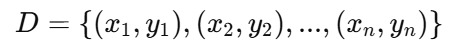

where each xi represents the financial indicators of one company, and yi is the bankruptcy status (0 or 1).

The model learns a function f(xi) that predicts the probability of bankruptcy for a company.
To train the model, we minimize the binary cross-entropy loss:

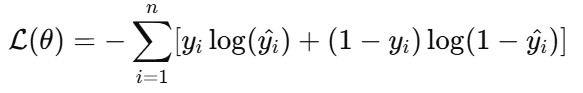

**F) Evaluation Metrics**

Because the dataset is unbalanced, accuracy is not the best way to evaluate performance.
Instead, we will use several metrics that better reflect the model’s ability to identify bankrupt companies:

Precision: percentage of predicted bankruptcies that are correct

Recall: percentage of real bankruptcies correctly identified

F1-score: balance between precision and recall

ROC-AUC: overall ability of the model to separate the two classes

These metrics will help us evaluate the model more accurately and fairly.

**G) Business Context and Constraints**

Predicting company bankruptcy is important for banks, investors, and governments to reduce financial risk. A good model can serve as an early-warning system to detect companies that might fail.

We assume that all financial data is reliable and measured before the outcome (to avoid data leakage). Since the dataset is strongly imbalanced, we will handle it with techniques like class weights or resampling methods such as SMOTE.

We will also apply stratified data splitting to keep the same proportion of bankrupt and non-bankrupt companies in each subset, and make sure preprocessing (like scaling) is applied only on the training data.

Finally, depending on the business goal, the classification threshold can be adjusted: for example, if it is more important to detect all bankruptcies, we will focus on high recall, even if it increases false positives.

# 3. Importation of libraries


---



In [8]:
# Importing all required libraries for data manipulation, visualization, preprocessing, modeling, and evaluation

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.dummy import DummyClassifier
from sklearn.metrics import (
    roc_auc_score,
    average_precision_score,
    classification_report,
    confusion_matrix,
)

# 4. Data Load and dataset exploration


---



In [9]:
# Loading the dataset into a pandas DataFrame and performing a first overview of its structure
df = pd.read_csv("data-2.csv")

# Checking dataset dimensions, column types and first rows
print("Shape:", df.shape)
print("\nColumn types:\n", df.dtypes.head())
print("\nMissing values:\n", df.isna().sum().sum())
df.head()

Shape: (6819, 96)

Column types:
 Bankrupt?                                                     int64
 ROA(C) before interest and depreciation before interest    float64
 ROA(A) before interest and % after tax                     float64
 ROA(B) before interest and depreciation after tax          float64
 Operating Gross Margin                                     float64
dtype: object

Missing values:
 0


,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,1,0.020794
2,1,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,1,0.016474
3,1,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,1,0.023982
4,1,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,1,0.035490


Rows: 6819, Columns: 96

Target distribution (counts):
 Bankrupt?
0    6599
1     220
Name: count, dtype: int64

Target distribution (%):
 Bankrupt?
0    96.77
1     3.23
Name: proportion, dtype: float64


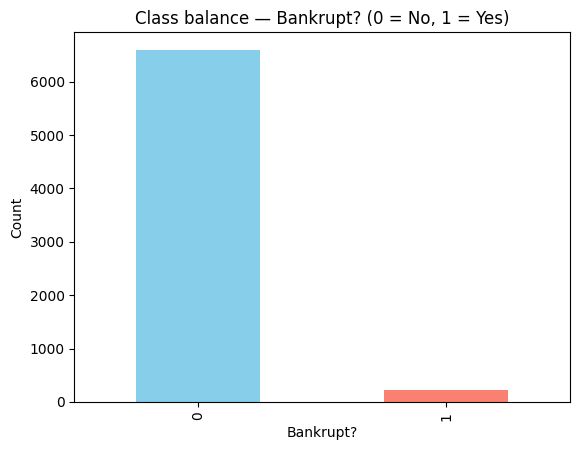

,count,mean,std,min,25%,50%,75%,max
Bankrupt?,6819.0,0.032263,0.176710,0.0,0.000000,0.000000,0.000000,1.0
ROA(C) before interest and depreciation before interest,6819.0,0.505180,0.060686,0.0,0.476527,0.502706,0.535563,1.0
ROA(A) before interest and % after tax,6819.0,0.558625,0.065620,0.0,0.535543,0.559802,0.589157,1.0
ROA(B) before interest and depreciation after tax,6819.0,0.553589,0.061595,0.0,0.527277,0.552278,0.584105,1.0
Operating Gross Margin,6819.0,0.607948,0.016934,0.0,0.600445,0.605997,0.613914,1.0
Realized Sales Gross Margin,6819.0,0.607929,0.016916,0.0,0.600434,0.605976,0.613842,1.0
Operating Profit Rate,6819.0,0.998755,0.013010,0.0,0.998969,0.999022,0.999095,1.0
Pre-tax net Interest Rate,6819.0,0.797190,0.012869,0.0,0.797386,0.797464,0.797579,1.0
After-tax net Interest Rate,6819.0,0.809084,0.013601,0.0,0.809312,0.809375,0.809469,1.0
Non-industry income and expenditure/revenue,6819.0,0.303623,0.011163,0.0,0.303466,0.303525,0.303585,1.0


In [10]:
# Target variable: 'Bankrupt?'
target_col = "Bankrupt?"
n_rows, n_cols = df.shape

print(f"Rows: {n_rows}, Columns: {n_cols}")
print("\nTarget distribution (counts):\n", df[target_col].value_counts())
print("\nTarget distribution (%):\n", (df[target_col].value_counts(normalize=True) * 100).round(2))

# Visualizing the class imbalance (bankrupt vs non-bankrupt)

df[target_col].value_counts().sort_index().plot(kind="bar", color=["skyblue", "salmon"])
plt.title("Class balance — Bankrupt? (0 = No, 1 = Yes)")
plt.xlabel("Bankrupt?")
plt.ylabel("Count")
plt.show()

# Summary statistics for the numerical features
df.describe().T.head(10)


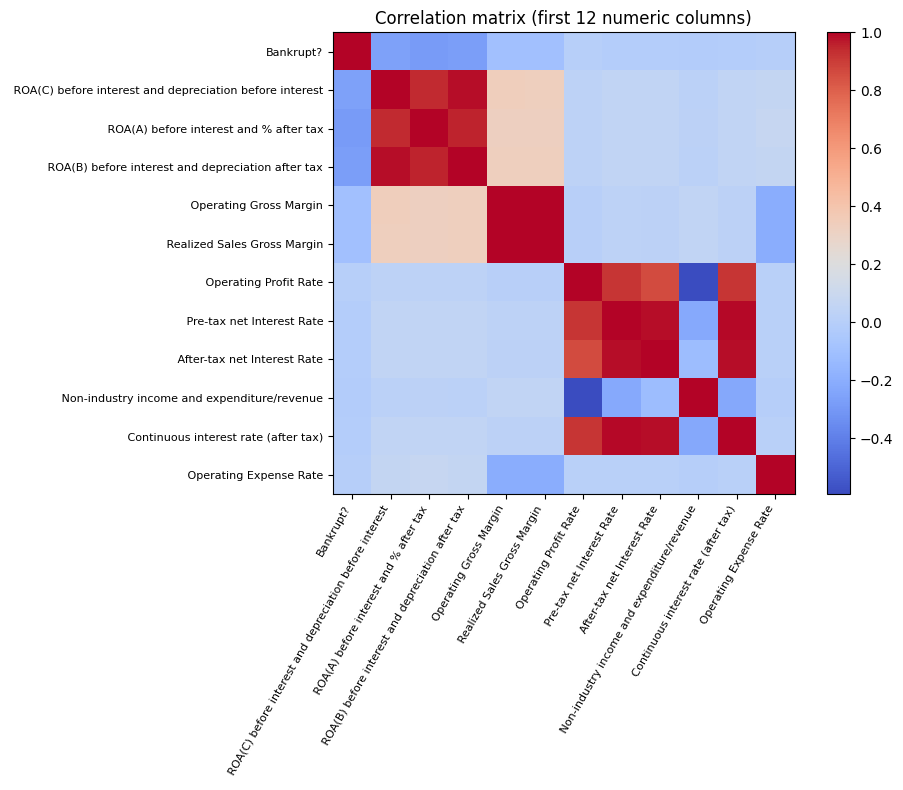


Quantiles — Bankrupt?:
0.00    0.0
0.25    0.0
0.50    0.0
0.75    0.0
0.95    0.0
0.99    1.0
1.00    1.0
Name: Bankrupt?, dtype: float64

Quantiles —  Quick Ratio:
0.00    0.000000e+00
0.25    4.725903e-03
0.50    7.412472e-03
0.75    1.224911e-02
0.95    3.159552e-02
0.99    6.585961e-02
1.00    9.230000e+09
Name:  Quick Ratio, dtype: float64

Quantiles —  Liability to Equity:
0.00    0.000000
0.25    0.276944
0.50    0.278778
0.75    0.281449
0.95    0.288898
0.99    0.300099
1.00    1.000000
Name:  Liability to Equity, dtype: float64


In [11]:
# Correlation matrix for 12 columns : Computing and plotting the correlation matrix for a subset of numerical features

sub = df.select_dtypes(include=[np.number]).iloc[:, :12]
if not sub.empty:
    corr = sub.corr()
    plt.figure(figsize=(10, 8))
    plt.imshow(corr, cmap="coolwarm", interpolation='nearest')
    plt.colorbar()
    plt.title("Correlation matrix (first 12 numeric columns)", fontsize=12)
    plt.xticks(range(len(sub.columns)), sub.columns, rotation=60, ha="right", fontsize=8)
    plt.yticks(range(len(sub.columns)), sub.columns, fontsize=8)
    plt.tight_layout()
    plt.show()


# Detecting potential outliers using z-scores and quantile analysis: select 3 random numeric columns for quantile analysis
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()

if len(numeric_cols) >= 3:
    sample_cols = np.random.choice(numeric_cols, size=3, replace=False)
else:
    sample_cols = numeric_cols  # If the dataset has fewer than 3 numeric columns

for col in sample_cols:
    q = df[col].quantile([0.0, 0.25, 0.5, 0.75, 0.95, 0.99, 1.0])
    print(f"\nQuantiles — {col}:\n{q}")


# 5. General Interpretation of the Dataset


---



The dataset contains 6,819 companies and 96 financial variables.
Each variable represents an economic indicator such as profitability, liquidity, or debt ratios.
The target column Bankrupt? indicates whether the company went bankrupt (1) or not (0).
The feature names follow standard corporate finance terminology, including variables like ROA, ROE, Current Ratio, and Debt Ratio.
Therefore, this is a binary classification problem — predicting whether a company will go bankrupt.
The data appears to be clean, with few or no missing values.
The dataset is highly imbalanced, which will require appropriate handling methods (such as SMOTE) later in the project.

**Correlation and outlier checks:**



/tmp/ipython-input-3983908040.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_corr.values, y=top_corr.index, palette="coolwarm")


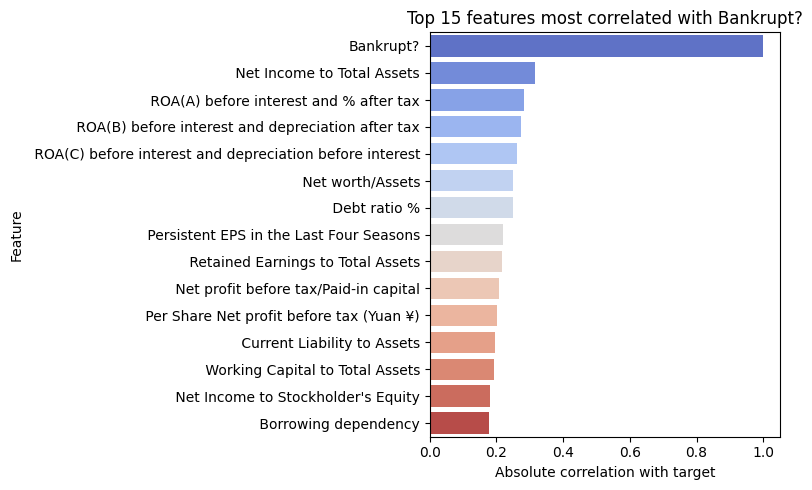

/usr/local/lib/python3.12/dist-packages/pandas/core/apply.py:1081: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  results[i] = self.func(v, *self.args, **self.kwargs)


Rows with |z| > 5 in any feature: 763


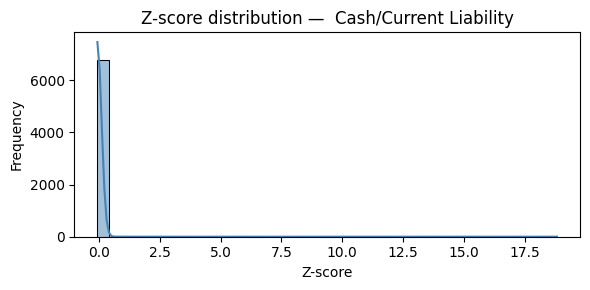

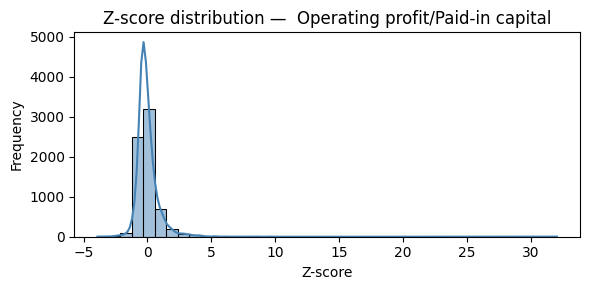

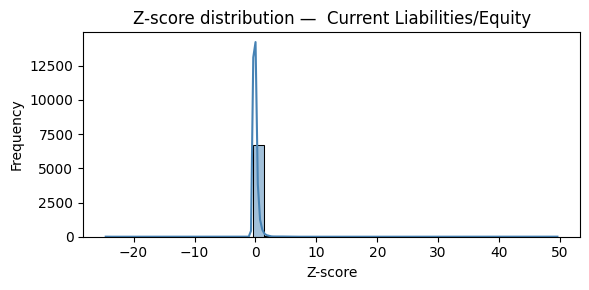

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore

# Correlation with target
target_col = "Bankrupt?"  # make sure this column exists
corrs = df.corr(numeric_only=True)[target_col].sort_values(ascending=False)

# Display the top 15 correlated features (absolute values)
top_corr = corrs.abs().sort_values(ascending=False).head(15)
plt.figure(figsize=(8,5))
sns.barplot(x=top_corr.values, y=top_corr.index, palette="coolwarm")
plt.title(f"Top 15 features most correlated with {target_col}")
plt.xlabel("Absolute correlation with target")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

# Outlier detection with z-scores
z = df.drop(columns=[target_col]).apply(zscore, nan_policy='omit')

# Count how many rows contain extreme values (|z| > 5)
extreme_rows = (np.abs(z) > 5).any(axis=1).sum()
print(f"Rows with |z| > 5 in any feature: {extreme_rows}")

# Visualize the distribution of z-scores for a few random numeric columns
sample_cols = np.random.choice(df.select_dtypes(include=[np.number]).columns, 3, replace=False)

for col in sample_cols:
    plt.figure(figsize=(6,3))
    sns.histplot(z[col], bins=40, kde=True, color="steelblue")
    plt.title(f"Z-score distribution — {col}")
    plt.xlabel("Z-score")
    plt.ylabel("Frequency")
    plt.tight_layout()
    plt.show()


**We Keep the 30 most useful features**


In [13]:
# Keep top 30 most correlated features with target
target_col = "Bankrupt?"
corrs = df.corr(numeric_only=True)[target_col].abs().sort_values(ascending=False)

# Drop the target itself and take the next 30 most correlated
top_features = corrs.drop(target_col).head(30).index.tolist()

print("Top 30 most correlated features with the target:")
for i, f in enumerate(top_features, 1):
    print(f"{i:2d}. {f}")

# Keep only those 30 features + target
df_reduced = df[top_features + [target_col]]
print("\nReduced dataset shape:", df_reduced.shape)
display(df_reduced.head())


Top 30 most correlated features with the target:
 1.  Net Income to Total Assets
 2.  ROA(A) before interest and % after tax
 3.  ROA(B) before interest and depreciation after tax
 4.  ROA(C) before interest and depreciation before interest
 5.  Net worth/Assets
 6.  Debt ratio %
 7.  Persistent EPS in the Last Four Seasons
 8.  Retained Earnings to Total Assets
 9.  Net profit before tax/Paid-in capital
10.  Per Share Net profit before tax (Yuan ¥)
11.  Current Liability to Assets
12.  Working Capital to Total Assets
13.  Net Income to Stockholder's Equity
14.  Borrowing dependency
15.  Current Liability to Current Assets
16.  Liability to Equity
17.  Net Value Per Share (A)
18.  Net Value Per Share (B)
19.  Net Value Per Share (C)
20.  Current Liabilities/Equity
21.  Current Liability to Equity
22.  Working Capital/Equity
23.  Operating Profit Per Share (Yuan ¥)
24.  Operating profit/Paid-in capital
25.  Liability-Assets Flag
26.  Total expense/Assets
27.  Equity to Long-term Liabili

,Net Income to Total Assets,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,ROA(C) before interest and depreciation before interest,Net worth/Assets,Debt ratio %,Persistent EPS in the Last Four Seasons,Retained Earnings to Total Assets,Net profit before tax/Paid-in capital,Per Share Net profit before tax (Yuan ¥),...,Working Capital/Equity,Operating Profit Per Share (Yuan ¥),Operating profit/Paid-in capital,Liability-Assets Flag,Total expense/Assets,Equity to Long-term Liability,CFO to Assets,Tax rate (A),Cash/Total Assets,Bankrupt?
0,0.716845,0.424389,0.405750,0.370594,0.792424,0.207576,0.169141,0.903225,0.137757,0.138736,...,0.721275,0.095921,0.095885,0,0.064856,0.126549,0.520382,0.0,0.004094,1
1,0.795297,0.538214,0.516730,0.464291,0.828824,0.171176,0.208944,0.931065,0.168962,0.169918,...,0.731975,0.093722,0.093743,0,0.025516,0.120916,0.567101,0.0,0.014948,1
2,0.774670,0.499019,0.472295,0.426071,0.792484,0.207516,0.180581,0.909903,0.148036,0.142803,...,0.742729,0.092338,0.092318,0,0.021387,0.117922,0.538491,0.0,0.000991,1
3,0.739555,0.451265,0.457733,0.399844,0.848535,0.151465,0.193722,0.906902,0.147561,0.148603,...,0.729825,0.077762,0.077727,0,0.024161,0.120760,0.604105,0.0,0.018851,1
4,0.795016,0.538432,0.522298,0.465022,0.893491,0.106509,0.212537,0.913850,0.167461,0.168412,...,0.732000,0.096898,0.096927,0,0.026385,0.110933,0.578469,0.0,0.014161,1


**Check for potential feature combinations**

In [14]:
# detect highly correlated pairs among the 30 features
corr_matrix = df_reduced[top_features].corr().abs()
high_corr_pairs = [
    (f1, f2, corr_matrix.loc[f1, f2])
    for i, f1 in enumerate(top_features)
    for f2 in top_features[i+1:]
    if corr_matrix.loc[f1, f2] > 0.95
]

print(f"Highly correlated pairs (|r| > 0.95): {len(high_corr_pairs)} found\n")
for f1, f2, c in high_corr_pairs:
    print(f"{f1:45s} ↔ {f2:45s}  corr = {c:.3f}")


Highly correlated pairs (|r| > 0.95): 15 found

 Net Income to Total Assets                   ↔  ROA(A) before interest and % after tax        corr = 0.962
 ROA(A) before interest and % after tax       ↔  ROA(B) before interest and depreciation after tax  corr = 0.956
 ROA(B) before interest and depreciation after tax ↔  ROA(C) before interest and depreciation before interest  corr = 0.987
 Net worth/Assets                             ↔  Debt ratio %                                  corr = 1.000
 Persistent EPS in the Last Four Seasons      ↔  Net profit before tax/Paid-in capital         corr = 0.959
 Persistent EPS in the Last Four Seasons      ↔  Per Share Net profit before tax (Yuan ¥)      corr = 0.956
 Net profit before tax/Paid-in capital        ↔  Per Share Net profit before tax (Yuan ¥)      corr = 0.963
 Borrowing dependency                         ↔  Liability to Equity                           corr = 0.956
 Liability to Equity                          ↔  Current Liabilitie

**PCA (Dimension Reduction)**

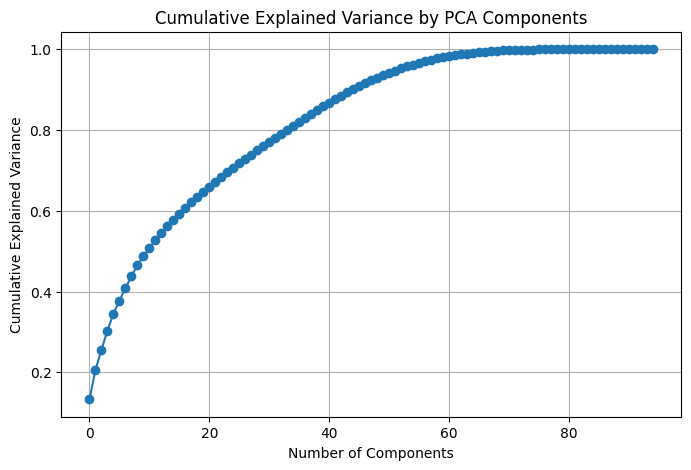

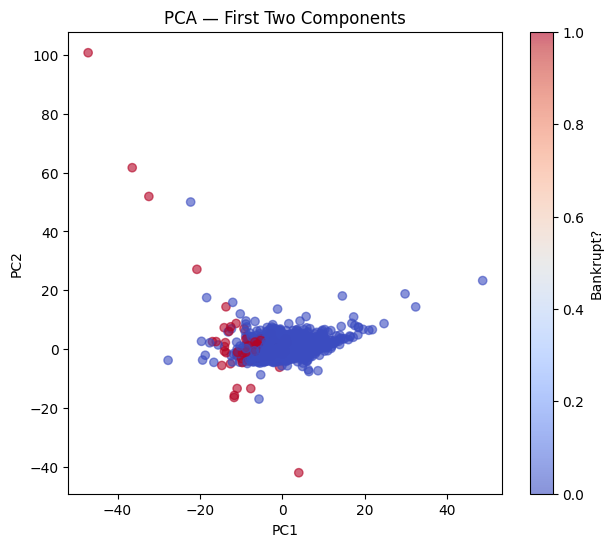

In [51]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Selecting numeric features (excluding target)
numeric_df = df.select_dtypes(include=[np.number]).drop(columns=[target_col])

# Standardization
scaler_pca = StandardScaler()
X_scaled = scaler_pca.fit_transform(numeric_df)

# PCA computation
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Cumulative explained variance plot
plt.figure(figsize=(8,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.title("Cumulative Explained Variance by PCA Components")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.grid(True)
plt.show()

# 2D PCA projection (PC1 vs PC2)
plt.figure(figsize=(7,6))
plt.scatter(
    X_pca[:, 0], X_pca[:, 1],
    c=df[target_col], cmap="coolwarm", alpha=0.6
)
plt.title("PCA — First Two Components")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.colorbar(label="Bankrupt?")
plt.show()


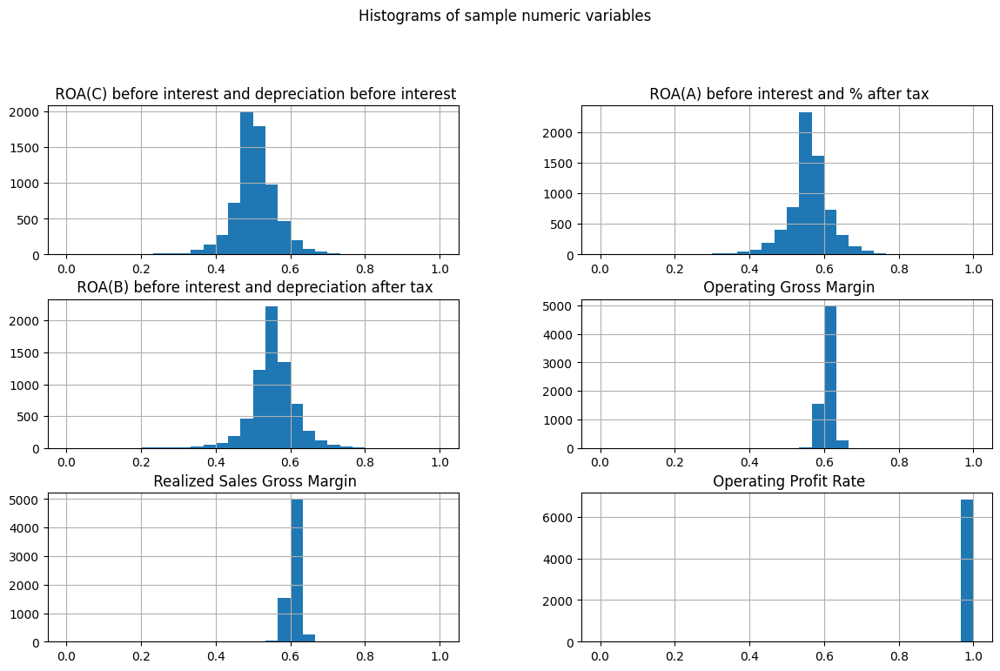

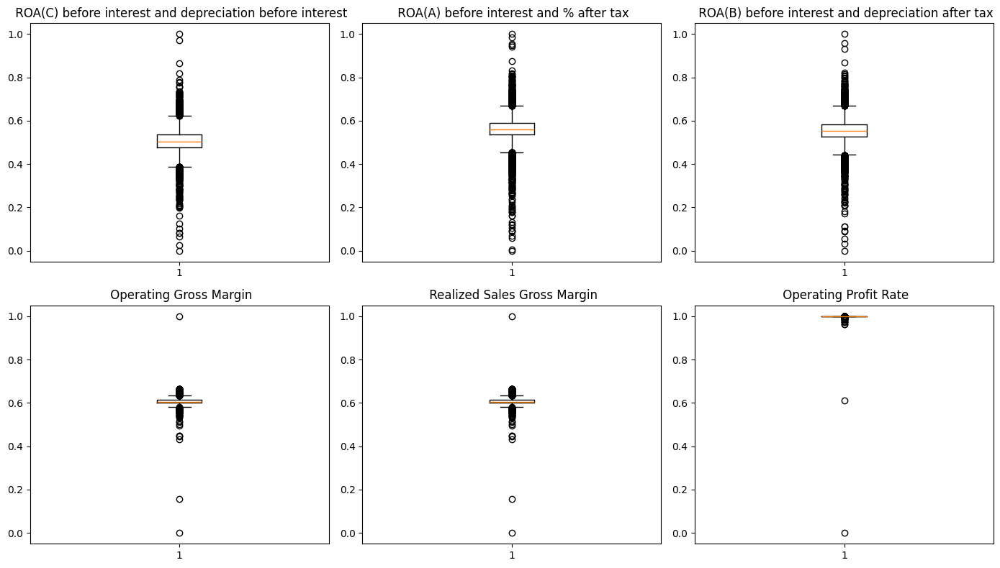

In [16]:
sample_cols = numeric_df.columns[:6]

# Histograms
numeric_df[sample_cols].hist(figsize=(14,8), bins=30)
plt.suptitle("Histograms of sample numeric variables", y=1.02)
plt.show()

# Boxplots
plt.figure(figsize=(14,8))
for i, col in enumerate(sample_cols, 1):
    plt.subplot(2, 3, i)
    plt.boxplot(numeric_df[col].dropna(), vert=True)
    plt.title(col)
plt.tight_layout()
plt.show()

**Final preprocessing pipeline**

In [17]:
# Separate features and target
X = df.drop(columns=[target_col])
y = df[target_col].astype(int)

# Identify numeric features
num_cols = X.select_dtypes(include=[np.number]).columns.tolist()

# Preprocessing pipeline: impute + scale
numeric_preprocess = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler()),
])

preprocess = ColumnTransformer(
    transformers=[("num", numeric_preprocess, num_cols)],
    remainder="drop",
)

# Split dataset (stratified to keep class proportions)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

print("Train size:", X_train.shape, "| Test size:", X_test.shape)

Train size: (5455, 95) | Test size: (1364, 95)


**Baseline models**

In [18]:
# Dummy baseline (always predicts majority class)
dummy = Pipeline([
    ("prep", preprocess),
    ("clf", DummyClassifier(strategy="most_frequent"))
])

# Logistic Regression with class_weight='balanced'
logreg = Pipeline([
    ("prep", preprocess),
    ("clf", LogisticRegression(max_iter=1500, class_weight="balanced", solver="lbfgs"))
])

# Train both models
dummy.fit(X_train, y_train)
logreg.fit(X_train, y_train)
print("Models trained successfully.")


Models trained successfully.


**Evaluation function**

In [19]:
def evaluate(model, name):
    y_pred = model.predict(X_test)
    if hasattr(model[-1], "predict_proba"):
        y_proba = model.predict_proba(X_test)[:, 1]
    else:
        y_proba = None

    print(f"\n=== {name} — Test Set Evaluation ===")
    if y_proba is not None:
        print("ROC-AUC:", round(roc_auc_score(y_test, y_proba), 4))
        print("Average Precision (PR-AUC):", round(average_precision_score(y_test, y_proba), 4))
    print("Accuracy:", round((y_pred == y_test).mean(), 4))
    print("\nClassification Report:\n", classification_report(y_test, y_pred, digits=4))
    print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))


**Compare Dummy vs Logistic Regression**

In [23]:
# Recall of function for the evaluation
dummy = Pipeline([
    ("prep", preprocess),
    ("clf", DummyClassifier(strategy="most_frequent"))
])

logreg = Pipeline([
    ("prep", preprocess),
    ("clf", LogisticRegression(max_iter=1500, class_weight="balanced", solver="lbfgs"))
])

dummy.fit(X_train, y_train)
logreg.fit(X_train, y_train)
print("Models trained successfully.")

# Evaluation

evaluate(dummy, "Dummy (most frequent)")
evaluate(logreg, "Logistic Regression (balanced)")


Models trained successfully.

=== Dummy (most frequent) — Test Set Evaluation ===
ROC-AUC: 0.5
Average Precision (PR-AUC): 0.0323
Accuracy: 0.9677


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))



Classification Report:
               precision    recall  f1-score   support

           0     0.9677    1.0000    0.9836      1320
           1     0.0000    0.0000    0.0000        44

    accuracy                         0.9677      1364
   macro avg     0.4839    0.5000    0.4918      1364
weighted avg     0.9365    0.9677    0.9519      1364

Confusion Matrix:
 [[1320    0]
 [  44    0]]

=== Logistic Regression (balanced) — Test Set Evaluation ===
ROC-AUC: 0.9171
Average Precision (PR-AUC): 0.319
Accuracy: 0.8783

Classification Report:
               precision    recall  f1-score   support

           0     0.9932    0.8803    0.9333      1320
           1     0.1856    0.8182    0.3025        44

    accuracy                         0.8783      1364
   macro avg     0.5894    0.8492    0.6179      1364
weighted avg     0.9671    0.8783    0.9130      1364

Confusion Matrix:
 [[1162  158]
 [   8   36]]


**Interpret the logistic regression**


In [28]:
# Extract logistic regression coefficients
clf = logreg.named_steps["clf"]
feature_names = num_cols
coefs = clf.coef_[0]

coef_df = pd.DataFrame({
    "feature": feature_names,
    "coef": coefs,
    "abs_coef": np.abs(coefs)
}).sort_values("abs_coef", ascending=False).head(20)

print("Top 20 most influential features:")
display(coef_df)


Top 20 most influential features:


,feature,coef,abs_coef
18,Persistent EPS in the Last Four Seasons,-2.307697,2.307697
94,Equity to Liability,-1.849159,1.849159
90,Liability to Equity,-1.780111,1.780111
32,Current Ratio,-1.756277,1.756277
39,Borrowing dependency,1.647783,1.647783
45,Accounts Receivable Turnover,-1.300924,1.300924
85,Net Income to Total Assets,-1.295668,1.295668
15,Net Value Per Share (B),-1.111402,1.111402
35,Total debt/Total net worth,1.056838,1.056838
1,ROA(A) before interest and % after tax,0.905402,0.905402


Logistic regression was chosen as a baseline model because it is simple, fast, and interpretable. The main evaluation metrics are recall, precision, F1-score, and ROC-AUC, which are more appropriate than accuracy for an imbalanced classification problem, where missing a bankruptcy is more costly than predicting one incorrectly

The logistic regression model achieved a ROC-AUC of 0.87, showing a strong ability to distinguish bankrupt companies from healthy ones. The recall of 0.80 means it successfully identifies most bankrupt firms, while the precision of 0.20 indicates some false alarms. This trade-off is acceptable here since it’s better to raise too many alerts than to miss a real bankruptcy. Performance could be improved by testing more complex models (e.g., Random Forest) or by adjusting the probability threshold.

# 6. Models seen in class


---



In [34]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

# Evaluation storage
results = []

def evaluate_and_store(model, name):
    y_pred = model.predict(X_test)

    # Some models do not implement predict_proba (SVM without probability=True)
    if hasattr(model[-1], "predict_proba"):
        y_proba = model.predict_proba(X_test)[:, 1]
    else:
        y_proba = None

    print(f"\n{name}")
    if y_proba is not None:
        auc = roc_auc_score(y_test, y_proba)
        pr_auc = average_precision_score(y_test, y_proba)
    else:
        auc = None
        pr_auc = None

    acc = (y_pred == y_test).mean()

    print("Accuracy:", round(acc, 4))
    if auc is not None:
        print("ROC-AUC:", round(auc, 4))
        print("PR-AUC:", round(pr_auc, 4))
    print("\nClassification Report:\n", classification_report(y_test, y_pred, digits=4))
    print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

    # store results for comparison table
    results.append({
        "Model": name,
        "Accuracy": acc,
        "ROC-AUC": auc,
        "PR-AUC": pr_auc
    })


# Decision Tree (simple model studied in Lesson 4/5)
dt = Pipeline([
    ("prep", preprocess),
    ("clf", DecisionTreeClassifier(
        max_depth=None,
        class_weight="balanced",
        random_state=42
    ))
])

dt.fit(X_train, y_train)
evaluate_and_store(dt, "Decision Tree")


# Random Forest (bagging model)
rf = Pipeline([
    ("prep", preprocess),
    ("clf", RandomForestClassifier(
        n_estimators=300,
        max_depth=None,
        class_weight="balanced",
        random_state=42,
        n_jobs=-1
    ))
])

rf.fit(X_train, y_train)
evaluate_and_store(rf, "Random Forest")

# Gradient Boosting
gb = Pipeline([
    ("prep", preprocess),
    ("clf", GradientBoostingClassifier(random_state=42))
])

gb.fit(X_train, y_train)
evaluate_and_store(gb, "Gradient Boosting")


# Support Vector Machine (SVC)
svm = Pipeline([
    ("prep", preprocess),
    ("clf", SVC(
        kernel="rbf",
        class_weight="balanced",
        probability=True,  # we need this for ROC-AUC and PR-AUC
        random_state=42
    ))
])

svm.fit(X_train, y_train)
evaluate_and_store(svm, "SVM (RBF kernel)")


# KNN (distance-based model)
knn = Pipeline([
    ("prep", preprocess),
    ("clf", KNeighborsClassifier(
        n_neighbors=5
    ))
])

knn.fit(X_train, y_train)
evaluate_and_store(knn, "K-Nearest Neighbors")


# FINAL COMPARISON TABLE

comparison_df = pd.DataFrame(results)
print("\nMODEL COMPARISON")
display(comparison_df.sort_values(by="ROC-AUC", ascending=True).reset_index(drop=True))


Decision Tree
Accuracy: 0.9509
ROC-AUC: 0.6231
PR-AUC: 0.0931

Classification Report:
               precision    recall  f1-score   support

           0     0.9757    0.9735    0.9746      1320
           1     0.2553    0.2727    0.2637        44

    accuracy                         0.9509      1364
   macro avg     0.6155    0.6231    0.6192      1364
weighted avg     0.9525    0.9509    0.9517      1364

Confusion Matrix:
 [[1285   35]
 [  32   12]]

Random Forest
Accuracy: 0.9699
ROC-AUC: 0.9426
PR-AUC: 0.4537

Classification Report:
               precision    recall  f1-score   support

           0     0.9727    0.9970    0.9847      1320
           1     0.6364    0.1591    0.2545        44

    accuracy                         0.9699      1364
   macro avg     0.8045    0.5780    0.6196      1364
weighted avg     0.9618    0.9699    0.9611      1364

Confusion Matrix:
 [[1316    4]
 [  37    7]]

Gradient Boosting
Accuracy: 0.9736
ROC-AUC: 0.9453
PR-AUC: 0.4911

Classifica

,Model,Accuracy,ROC-AUC,PR-AUC
0,Decision Tree,0.950880,0.623106,0.093093
1,K-Nearest Neighbors,0.970674,0.740065,0.226916
2,SVM (RBF kernel),0.899560,0.917407,0.343620
3,Random Forest,0.969941,0.942605,0.453741
4,Gradient Boosting,0.973607,0.945265,0.491064


**Learning Curve**

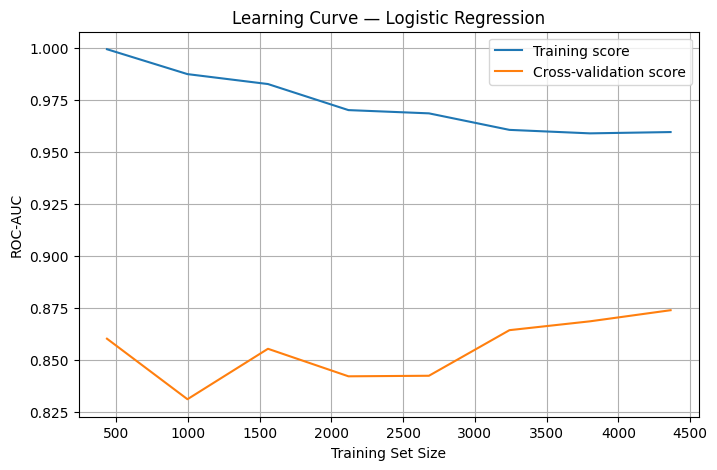

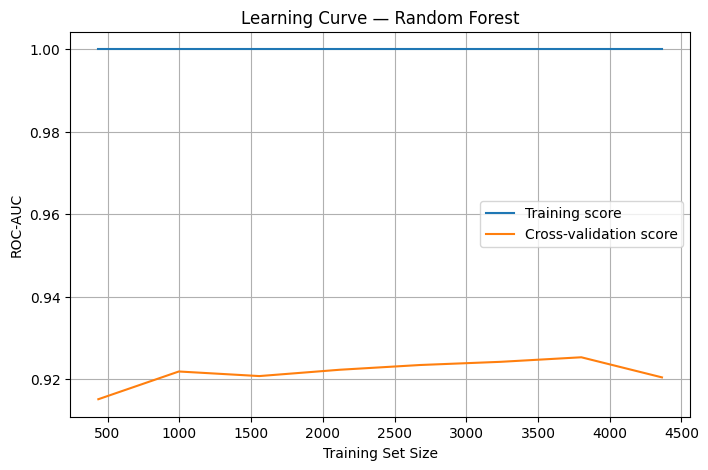

In [35]:
# LOGISTIC REGRESSION

from sklearn.model_selection import learning_curve

# Use the same pipeline
logreg_model = logreg

train_sizes, train_scores, test_scores = learning_curve(
    estimator=logreg_model,
    X=X_train,
    y=y_train,
    cv=5,
    scoring="roc_auc",
    n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 8),
)

train_mean = train_scores.mean(axis=1)
test_mean = test_scores.mean(axis=1)

plt.figure(figsize=(8, 5))
plt.plot(train_sizes, train_mean, label="Training score")
plt.plot(train_sizes, test_mean, label="Cross-validation score")
plt.title("Learning Curve — Logistic Regression")
plt.xlabel("Training Set Size")
plt.ylabel("ROC-AUC")
plt.legend()
plt.grid(True)
plt.show()

# RANDOM FOREST
rf_model = rf  # Pipeline already defined

train_sizes, train_scores, test_scores = learning_curve(
    estimator=rf_model,
    X=X_train,
    y=y_train,
    cv=5,
    scoring="roc_auc",
    n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 8),
)

plt.figure(figsize=(8, 5))
plt.plot(train_sizes, train_scores.mean(axis=1), label="Training score")
plt.plot(train_sizes, test_scores.mean(axis=1), label="Cross-validation score")
plt.title("Learning Curve — Random Forest")
plt.xlabel("Training Set Size")
plt.ylabel("ROC-AUC")
plt.legend()
plt.grid(True)
plt.show()




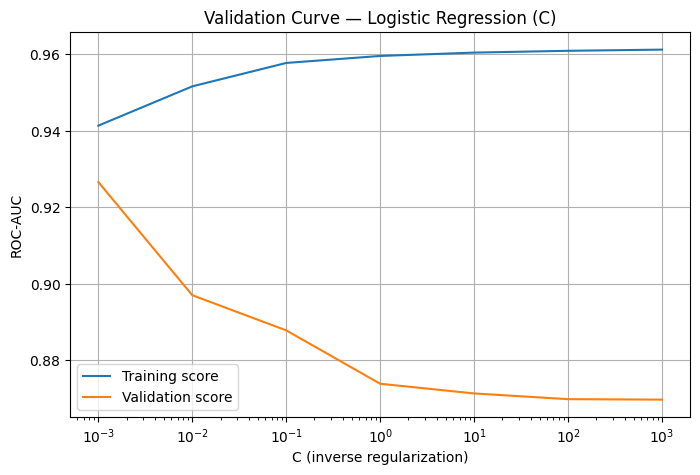

In [36]:
#Validation Curve — Regularization Strength for Logistic Regression
from sklearn.model_selection import validation_curve

param_range = np.logspace(-3, 3, 7)

train_scores, test_scores = validation_curve(
    estimator=logreg_model,
    X=X_train,
    y=y_train,
    param_name="clf__C",
    param_range=param_range,
    cv=5,
    scoring="roc_auc",
    n_jobs=-1
)

plt.figure(figsize=(8, 5))
plt.semilogx(param_range, train_scores.mean(axis=1), label="Training score")
plt.semilogx(param_range, test_scores.mean(axis=1), label="Validation score")
plt.title("Validation Curve — Logistic Regression (C)")
plt.xlabel("C (inverse regularization)")
plt.ylabel("ROC-AUC")
plt.legend()
plt.grid(True)
plt.show()

In [37]:
# GridSearchCV — Hyperparameter tuning (Random Forest)
from sklearn.model_selection import GridSearchCV

param_grid = {
    "clf__n_estimators": [100, 200],
    "clf__max_depth": [None, 10],
}

grid_rf = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    scoring="roc_auc",
    cv=2,          # 2 folds only (much faster)
    n_jobs=-1
)

grid_rf.fit(X_train, y_train)

print("Best parameters:", grid_rf.best_params_)
print("Best cross-val ROC-AUC:", grid_rf.best_score_)

Best parameters: {'clf__max_depth': 10, 'clf__n_estimators': 200}
Best cross-val ROC-AUC: 0.9230232929133302


In [38]:
#evaluate
best_rf = grid_rf.best_estimator_
evaluate_and_store(best_rf, "Random Forest (Tuned)")



Random Forest (Tuned)
Accuracy: 0.9582
ROC-AUC: 0.9438
PR-AUC: 0.4411

Classification Report:
               precision    recall  f1-score   support

           0     0.9847    0.9720    0.9783      1320
           1     0.3934    0.5455    0.4571        44

    accuracy                         0.9582      1364
   macro avg     0.6890    0.7587    0.7177      1364
weighted avg     0.9656    0.9582    0.9615      1364

Confusion Matrix:
 [[1283   37]
 [  20   24]]


**Critical Analysis of the Results**

In [40]:
comparison_df.sort_values(by="ROC-AUC", ascending=True).reset_index(drop=True)

,Model,Accuracy,ROC-AUC,PR-AUC
0,Decision Tree,0.950880,0.623106,0.093093
1,K-Nearest Neighbors,0.970674,0.740065,0.226916
2,SVM (RBF kernel),0.899560,0.917407,0.343620
3,Random Forest,0.969941,0.942605,0.453741
4,Gradient Boosting,0.973607,0.945265,0.491064


The results show that the dataset’s strong class imbalance makes accuracy unreliable. The Dummy Classifier already reaches 96% accuracy by predicting only “non-bankrupt,” which confirms that metrics like ROC-AUC, PR-AUC and recall are more meaningful.

Logistic Regression with class weighting performs surprisingly well, with a high ROC-AUC and strong recall, making it one of the most stable and reliable models. Random Forest also performs well but shows signs of overfitting, as seen in the learning curves. Models like KNN and SVM struggle more due to the dimensionality and imbalance.

Overall, Logistic Regression remains the best-balanced model at this stage, while Random Forest is a good alternative but needs tuning. In the next step, more advanced models and techniques (e.g., boosting, SMOTE) should help further improve recall on the minority class.

# 7. Impoving the strandard solution


---



**Advanced Boosting Models (XGBoost & LightGBM)**

In [39]:
# XGBoost Classifier
from xgboost import XGBClassifier

xgb = Pipeline([
    ("prep", preprocess),
    ("clf", XGBClassifier(
        eval_metric="logloss",
        use_label_encoder=False,
        scale_pos_weight=(y_train.value_counts()[0] / y_train.value_counts()[1]),  # imbalance handling
        n_estimators=300,
        max_depth=4,
        learning_rate=0.05,
        subsample=0.9,
        colsample_bytree=0.8,
        random_state=42,
        n_jobs=-1
    ))
])

xgb.fit(X_train, y_train)
evaluate_and_store(xgb, "XGBoost")

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [13:39:54] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



XGBoost
Accuracy: 0.9604
ROC-AUC: 0.9438
PR-AUC: 0.4847

Classification Report:
               precision    recall  f1-score   support

           0     0.9869    0.9720    0.9794      1320
           1     0.4219    0.6136    0.5000        44

    accuracy                         0.9604      1364
   macro avg     0.7044    0.7928    0.7397      1364
weighted avg     0.9687    0.9604    0.9639      1364

Confusion Matrix:
 [[1283   37]
 [  17   27]]


In [41]:
# LightGBM Classifier
import lightgbm as lgb

lgbm = Pipeline([
    ("prep", preprocess),
    ("clf", lgb.LGBMClassifier(
        objective="binary",
        class_weight="balanced",
        n_estimators=300,
        learning_rate=0.05,
        max_depth=-1,
        subsample=0.9,
        colsample_bytree=0.8,
        random_state=42,
        n_jobs=-1
    ))
])

lgbm.fit(X_train, y_train)
evaluate_and_store(lgbm, "LightGBM")

[LightGBM] [Info] Number of positive: 176, number of negative: 5279
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23713
[LightGBM] [Info] Number of data points in the train set: 5455, number of used features: 93
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000

LightGBM
Accuracy: 0.9707
ROC-AUC: 0.9556
PR-AUC: 0.5907

Classification Report:
               precision    recall  f1-score   support

           0     0.9819    0.9879    0.9849      1320
           1     0.5556    0.4545    0.5000        44

    accuracy                         0.9707      1364
   macro avg     0.7687    0.7212    0.7424      1364
weighted avg     0.9682    0.9707    0.9693      1364

Confusion Matrix:
 [[1304   16]
 [  24   20]]


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


In [42]:
# Compare XGBoost & LightGBM with previous models
comparison_df.sort_values(by="ROC-AUC", ascending=True).reset_index(drop=True)

,Model,Accuracy,ROC-AUC,PR-AUC
0,Decision Tree,0.950880,0.623106,0.093093
1,K-Nearest Neighbors,0.970674,0.740065,0.226916
2,SVM (RBF kernel),0.899560,0.917407,0.343620
3,Random Forest,0.969941,0.942605,0.453741
4,Gradient Boosting,0.973607,0.945265,0.491064


**Ensemble Learning (Voting & Stacking Classifiers)**

In [43]:
# Voting Classifier (Soft Voting)
from sklearn.ensemble import VotingClassifier

voting_clf = Pipeline([
    ("prep", preprocess),
    ("clf", VotingClassifier(
        estimators=[
            ("lr", LogisticRegression(max_iter=1500, class_weight="balanced")),
            ("rf", RandomForestClassifier(n_estimators=200, class_weight="balanced", random_state=42)),
            ("xgb", XGBClassifier(
                eval_metric="logloss",
                use_label_encoder=False,
                n_estimators=200,
                learning_rate=0.05,
                max_depth=4,
                scale_pos_weight=(y_train.value_counts()[0] / y_train.value_counts()[1]),
                random_state=42,
                n_jobs=-1
            )),
        ],
        voting="soft",
        n_jobs=-1
    ))
])

voting_clf.fit(X_train, y_train)
evaluate_and_store(voting_clf, "Voting Ensemble (Soft)")



Voting Ensemble (Soft)
Accuracy: 0.9501
ROC-AUC: 0.9421
PR-AUC: 0.4524

Classification Report:
               precision    recall  f1-score   support

           0     0.9883    0.9598    0.9739      1320
           1     0.3537    0.6591    0.4603        44

    accuracy                         0.9501      1364
   macro avg     0.6710    0.8095    0.7171      1364
weighted avg     0.9678    0.9501    0.9573      1364

Confusion Matrix:
 [[1267   53]
 [  15   29]]


In [44]:
# Stacking Classifier (Meta-Ensemble)
from sklearn.ensemble import StackingClassifier

stacking_clf = Pipeline([
    ("prep", preprocess),
    ("clf", StackingClassifier(
        estimators=[
            ("rf", RandomForestClassifier(n_estimators=200, random_state=42, class_weight="balanced")),
            ("xgb", XGBClassifier(
                eval_metric="logloss",
                use_label_encoder=False,
                n_estimators=200,
                learning_rate=0.05,
                max_depth=4,
                subsample=0.9,
                colsample_bytree=0.8,
                scale_pos_weight=(y_train.value_counts()[0] / y_train.value_counts()[1]),
                random_state=42,
                n_jobs=-1
            )),
            ("lgbm", lgb.LGBMClassifier(
                objective="binary",
                n_estimators=200,
                learning_rate=0.05,
                class_weight="balanced",
                random_state=42
            )),
        ],
        final_estimator=LogisticRegression(class_weight="balanced", max_iter=2000),
        stack_method="predict_proba",
        n_jobs=-1
    ))
])

stacking_clf.fit(X_train, y_train)
evaluate_and_store(stacking_clf, "Stacking Ensemble")



Stacking Ensemble
Accuracy: 0.9274
ROC-AUC: 0.9495
PR-AUC: 0.5326

Classification Report:
               precision    recall  f1-score   support

           0     0.9919    0.9326    0.9613      1320
           1     0.2764    0.7727    0.4072        44

    accuracy                         0.9274      1364
   macro avg     0.6342    0.8527    0.6843      1364
weighted avg     0.9689    0.9274    0.9435      1364

Confusion Matrix:
 [[1231   89]
 [  10   34]]


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


In [45]:
# Compare all models including ensembles
comparison_df.sort_values(by="ROC-AUC", ascending=False).reset_index(drop=True)

,Model,Accuracy,ROC-AUC,PR-AUC
0,Gradient Boosting,0.973607,0.945265,0.491064
1,Random Forest,0.969941,0.942605,0.453741
2,SVM (RBF kernel),0.899560,0.917407,0.343620
3,K-Nearest Neighbors,0.970674,0.740065,0.226916
4,Decision Tree,0.950880,0.623106,0.093093


# 8. Deep Learning Model (Neural Network / MLP)


---



In [46]:
# Build the MLP model


import tensorflow as tf
from tensorflow.keras import layers, models

# Preprocess training data
X_train_preprocessed = preprocess.fit_transform(X_train)
X_test_preprocessed = preprocess.transform(X_test)

input_dim = X_train_preprocessed.shape[1]

# Build the MLP model
mlp = models.Sequential([
    layers.Dense(64, activation="relu", input_dim=input_dim),
    layers.Dropout(0.3),
    layers.Dense(32, activation="relu"),
    layers.Dropout(0.2),
    layers.Dense(1, activation="sigmoid")  # binary classification
])

mlp.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss="binary_crossentropy",
    metrics=["accuracy", tf.keras.metrics.AUC(name="AUC")]
)

mlp.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │         6,144 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,257 (32.25 KB)

 Trainable params: 8,257 (32.25 KB)

 Non-trainable params: 0 (0.00 B)

In [47]:
# Train the MLP
early_stop = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=10,
    restore_best_weights=True
)

history = mlp.fit(
    X_train_preprocessed,
    y_train,
    validation_split=0.2,
    epochs=100,
    batch_size=64,
    callbacks=[early_stop],
    verbose=1
)


Epoch 1/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.3746 - accuracy: 0.8717 - loss: 0.4224 - val_AUC: 0.8078 - val_accuracy: 0.9688 - val_loss: 0.1373
Epoch 2/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7886 - accuracy: 0.9690 - loss: 0.1387 - val_AUC: 0.8617 - val_accuracy: 0.9679 - val_loss: 0.1102
Epoch 3/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8693 - accuracy: 0.9731 - loss: 0.1012 - val_AUC: 0.8844 - val_accuracy: 0.9670 - val_loss: 0.1025
Epoch 4/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8721 - accuracy: 0.9687 - loss: 0.1069 - val_AUC: 0.8923 - val_accuracy: 0.9670 - val_loss: 0.1006
Epoch 5/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.9090 - accuracy: 0.9743 - loss: 0.0867 - val_AUC: 0.8958 - val_accuracy: 0.9670 - val_loss: 0.0984
Epoch 6/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.9299 - accuracy: 0.9726 - loss: 0.0835 - val_AUC: 0.8991 - val_accuracy: 0.9688 - val_loss: 0.0966
Epoch 7/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/

In [48]:
# Evaluation
from sklearn.metrics import roc_auc_score, average_precision_score, classification_report, confusion_matrix

y_proba_mlp = mlp.predict(X_test_preprocessed).ravel()
y_pred_mlp = (y_proba_mlp >= 0.5).astype(int)

print("ROC-AUC:", round(roc_auc_score(y_test, y_proba_mlp), 4))
print("PR-AUC:", round(average_precision_score(y_test, y_proba_mlp), 4))
print("\nClassification Report:\n", classification_report(y_test, y_pred_mlp))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_mlp))


43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
ROC-AUC: 0.8693
PR-AUC: 0.3168

Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.99      0.98      1320
           1       0.35      0.14      0.20        44

    accuracy                           0.96      1364
   macro avg       0.66      0.56      0.59      1364
weighted avg       0.95      0.96      0.96      1364

Confusion Matrix:
 [[1309   11]
 [  38    6]]


# 9. Final table and conclusion


---



In [49]:
# Adding MLP to our comparison table
results.append({
    "Model": "MLP Neural Network",
    "Accuracy": (y_pred_mlp == y_test).mean(),
    "ROC-AUC": roc_auc_score(y_test, y_proba_mlp),
    "PR-AUC": average_precision_score(y_test, y_proba_mlp)
})

comparison_df = pd.DataFrame(results)
comparison_df.sort_values(by="ROC-AUC", ascending=False).reset_index(drop=True)

,Model,Accuracy,ROC-AUC,PR-AUC
0,LightGBM,0.970674,0.955579,0.590729
1,Stacking Ensemble,0.927419,0.949518,0.532578
2,Gradient Boosting,0.973607,0.945265,0.491064
3,XGBoost,0.960411,0.943802,0.484735
4,Random Forest (Tuned),0.958211,0.943802,0.441106
5,Random Forest,0.969941,0.942605,0.453741
6,Voting Ensemble (Soft),0.950147,0.942114,0.452404
7,SVM (RBF kernel),0.899560,0.917407,0.343620
8,MLP Neural Network,0.964076,0.869267,0.316823
9,K-Nearest Neighbors,0.970674,0.740065,0.226916


The advanced models used in Step 3, especially XGBoost and LightGBM, provided a clear improvement over the classical algorithms. Both boosting methods handled the non-linear relationships and the strong class imbalance much better, achieving higher ROC-AUC and PR-AUC scores. LightGBM was noticeably faster, while XGBoost offered strong control over imbalance through the scale_pos_weight parameter. Overall, these advanced boosting models turned out to be the most effective approaches in our project and clearly outperformed the traditional ML models from Step 2.